# Исследование рынка общественного питания в Москве

## Презентация результатов
[Презентация](<https://drive.google.com/file/d/1N-30DigKeZDe8PpvVzaCKhJ6yDPTu0wG/view?usp=sharing>)

***Описание и цели проекта***

Для целей анализа рынка общественного питания в Москве изучим следующие имеющиеся в распоряжении данные: 
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

На основаниии указанных данных:

1. Осуществим предобработку данных
2. Проанализируем данные:
- Категории заведений, количество посадочных мест по категориям
- Сетевые и несетевые заведения, их категории, самые популярные сети Москвы
- Распределение заведений по районам Москвы
- Рейтинги завдений и их распределение по заведениям и районам Москвы
- Средние чеки в разных заведениях и районах Москвы
3. Детально изучим кофейни: распределение по районам Москвы, рейтинни и ценовую политику

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
import math as mth
from scipy import stats as st
import plotly.express as px
import folium 
import json
import requests
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go 

In [2]:
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
# Выведем основную информацию о датафрейме
data.info()
data.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


## Предобработка данных

In [4]:
# Для поиска дубликатов приведем названия и адреса к нижнему регистру и выведем количество явных дубликатов
col_to_change = ['name', 'category', 'address', 'hours', 'price', 'avg_bill']
for col in col_to_change:
    data[col] = data[col].str.lower()

f'Количество явных дубликатов: {data.duplicated().sum()}'

'Количество явных дубликатов: 0'

In [5]:
# Выведем неявные дубликаты по названию и адресу заведения
data[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [6]:
# Удалим обнаруженные дубликаты
data = data.drop_duplicates(subset = ['name', 'address'])

In [7]:
# Определим процент пропущенных значений
(data.isna().sum()/data.shape[0]*100).round(2)

name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.37
lat                   0.00
lng                   0.00
rating                0.00
price                60.55
avg_bill             54.58
middle_avg_bill      62.52
middle_coffee_cup    93.63
chain                 0.00
seats                42.97
dtype: float64

In [8]:
# Запролним пропуски в столбце 'hours' текстом 'нет данных'
data['hours'] = data['hours'].fillna('нет данных')

В оставшихся столбцах объем пропущенных значений превышвышает 40, 50, 60 и даже 90%. Удаление может привести к потере большой части данных, а приблизотельное заполнение исходя их средних/медианных значений к искажению реальных данных, поэтому оставим пропуски в остальных столбцах без обработки.

In [9]:
# Создадим столбец с названиями улиц из столбца с адресом
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])

# Создадим столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
# True — если заведение работает ежедневно и круглосуточно
# False — в противоположном случае
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

 ## Анализ данных

In [10]:
# Установим пользовательскую палитру
user_palette = ['#A0937D', '#CCD3CA', '#E6B9A6', '#B6C7AA', '#DED0B6', '#607274', '#939185', '#2F3645', '#D6DAC8', '#9CAFAA', '#967E76', '#A2A378', '#E4D0D0', '#A4907C', '#C7BCA1', '#AA8B56']
sns.set_palette(user_palette)
sns.set_style('whitegrid')


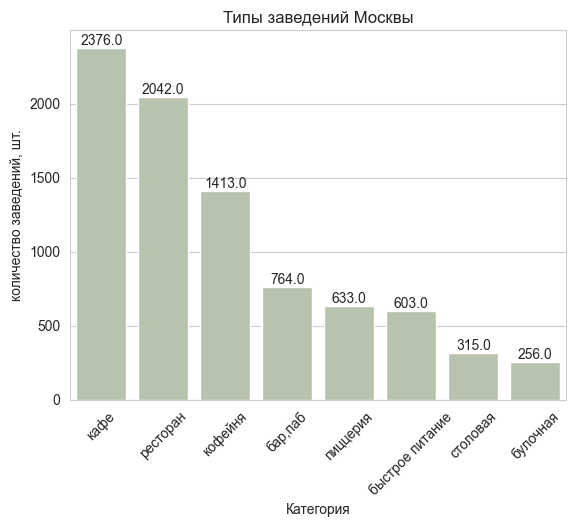

In [15]:
# Изучим категории заведений, представленных в данных

data_by_category = (data
                    .pivot_table(index = 'category', values = 'name', aggfunc = 'count')
                    .sort_values(by = 'name', ascending = False)
                    .reset_index()
                    .rename(columns = {'name':'количество заведений, шт.', 'category': 'Категория'})
                   )
ax = sns.barplot(x = 'Категория', y = 'количество заведений, шт.', data = data_by_category, color = '#B6C7AA')
plt.title('Типы заведений Москвы')
plt.xticks(rotation = 45)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width()/2, p.get_height()), ha = 'center', va = 'bottom')
plt.show()

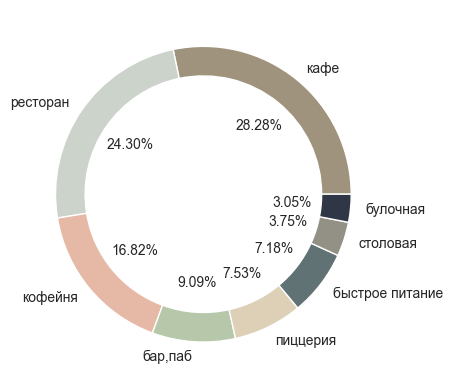

In [17]:
# Отобразим доли каждого из типов заведений
data_by_category['Доля от общего числа'] = data_by_category['количество заведений, шт.']/data_by_category['количество заведений, шт.'].sum()
plt.pie(data_by_category['Доля от общего числа'], labels=data_by_category['Категория'], autopct = '%.2f%%', wedgeprops = dict(width = 0.2))
plt.show()

Наиболее популярные типы заведений Москвы - кафе (более 2,3 тыс. заведений) и рестораны (более 2 тыс. завдений), на них приходится более 50 % всех заведений Москвы. Далее по популярности - кофейни (более 1,4 тыс заведений), которые занимают 16,8 % рынка. Наименьшее количество завдений - булочные и столовые (менее 500 хаведений каждая категория).

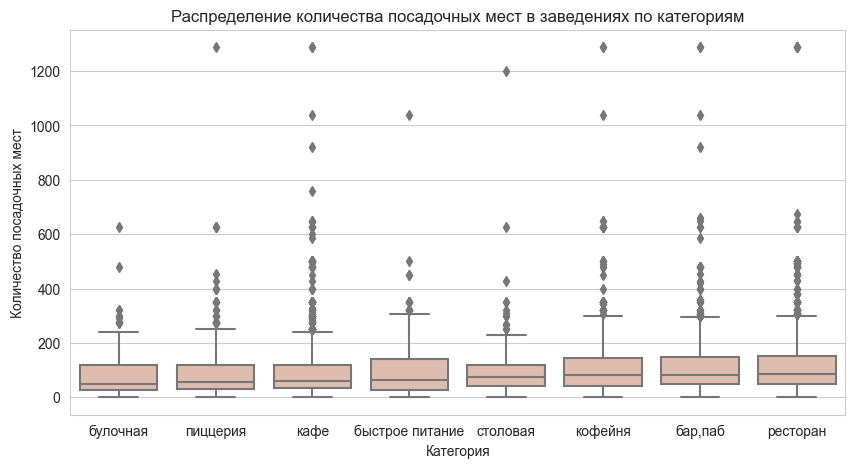

In [16]:
# Изучим распределение количества посадочных мест в заведениях по категориям
plt.figure(figsize = (10, 5))
sns.boxplot(x='category', y='seats',data=data, color = '#E6B9A6', order = data.pivot_table(index = 'category',  values = 'seats', aggfunc  = 'median').reset_index().sort_values(by='seats')['category'].tolist())
plt.title('Распределение количества посадочных мест в заведениях по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

Кафе, бары, пабы и кафе имеют значительное число выбросов в количестве посадочных мест, при этом среднее количество посадочных мест больше у ресторанов, пабов и баров, а меньше остальных - у булочных и пиццерий.

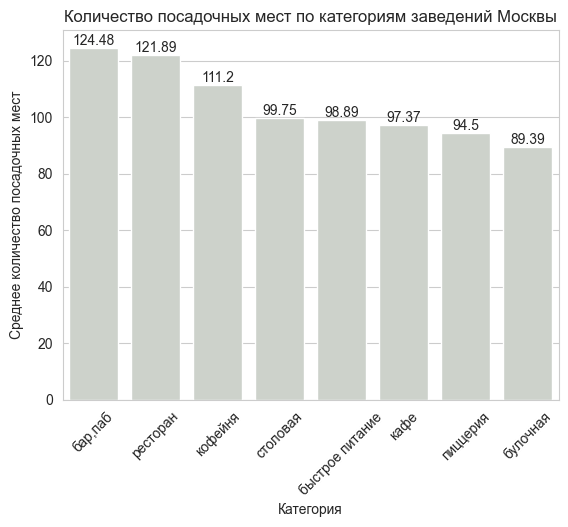

In [19]:
# Изучим среднее количество посадочных мест в заведениях по категориям

data_seats_by_category = (data
                    .pivot_table(index = 'category', values = 'seats', aggfunc = 'mean')
                    .sort_values(by = 'seats', ascending = False)
                    .reset_index()
                    .rename(columns = {'seats':'Среднее количество посадочных мест', 'category': 'Категория'})
                   )
data_seats_by_category['Среднее количество посадочных мест'] = data_seats_by_category['Среднее количество посадочных мест'].round(2)
ax = sns.barplot(x = 'Категория', y = 'Среднее количество посадочных мест', data = data_seats_by_category, color = '#CCD3CA')
plt.title('Количество посадочных мест по категориям заведений Москвы')
plt.xticks(rotation = 45)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width()/2, p.get_height()), ha = 'center', va = 'bottom')
plt.show()

В среднем бары, пабы и рестораны вмещают больше людей, чем другие заведения - медианное количество посадочных мест в каждом из этих типов заведений превышает 120, далее по убыванию - кофейни, вместительность которых около 111 мест. Наименее вместительны столовые,заведения быстрого питания, кафе, булочные и пиццерии (не более 100 мест). В целом, разница между медианным значением  числа посадочных мест в разных типах заведений небольшая.

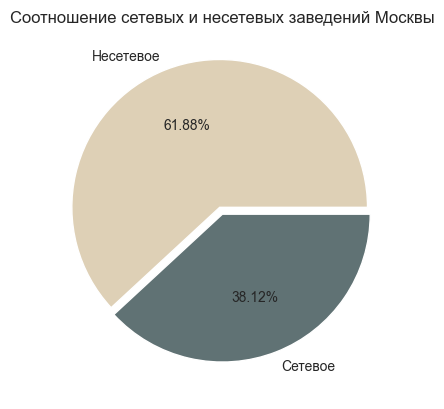

In [22]:
# Изучим соотношение сетевых и несетевых заведений

data['chain'] = data['chain'].replace(0, 'Несетевое').replace(1, 'Сетевое')

data_by_chain = (data
                    .pivot_table(index = 'chain', values = 'name', aggfunc = 'count')
                    .sort_values(by = 'name', ascending = False)
                    .reset_index()
                    .rename(columns = {'name':'Количество заведений', 'chain': 'Сетевое/несетевое'})
                   )
data_by_chain['Доля от общего числа'] = data_by_chain['Количество заведений']/data_by_chain['Количество заведений'].sum()

plt.pie(data_by_chain['Доля от общего числа'], labels = data_by_chain['Сетевое/несетевое'], colors = ['#DED0B6', '#607274'], autopct = '%.2f%%', explode = [0.05, 0])
plt.title('Соотношение сетевых и несетевых заведений Москвы')
plt.show()


Большая часть заведений Москвы - 61,88 % не является частью сети.

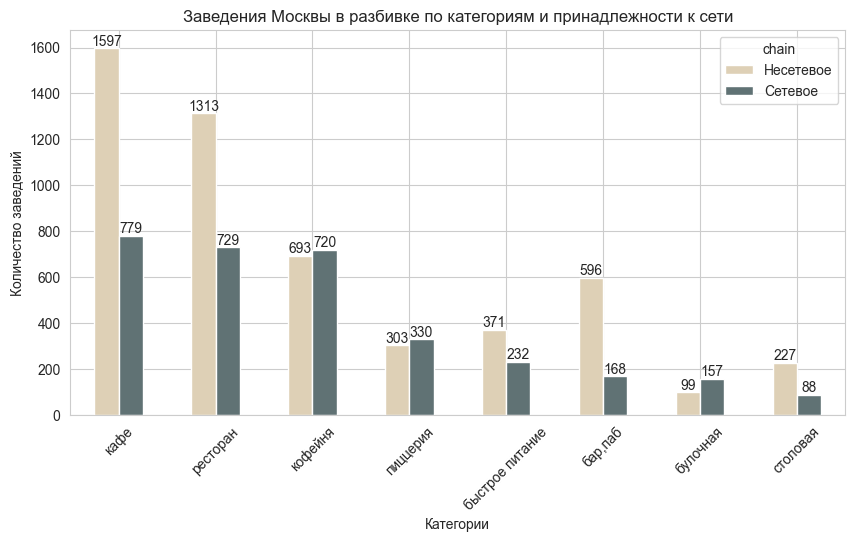

In [24]:
# Изучим, какие категории заведений чаще являются сетевыми
data_by_chain_category = (data
                    .pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
                    .sort_values(by = 'Сетевое', ascending = False)
                   )
ax = data_by_chain_category.plot(kind = 'bar', figsize = (10, 5), color = ['#DED0B6', '#607274'])
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width()/2, p.get_height()), ha = 'center', va = 'bottom')
plt.title('Заведения Москвы в разбивке по категориям и принадлежности к сети')
plt.xticks(rotation = 45)
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.show()

В абсолютном выражении больше всего сетевых заведений среди кафе, ресторанов и кофеен, что отражает распределение завдений Москвы по категориям в целом. При этом, в пиццериях, кофейнях и булочных доля сетевых заведений превышает долю несетевых. 

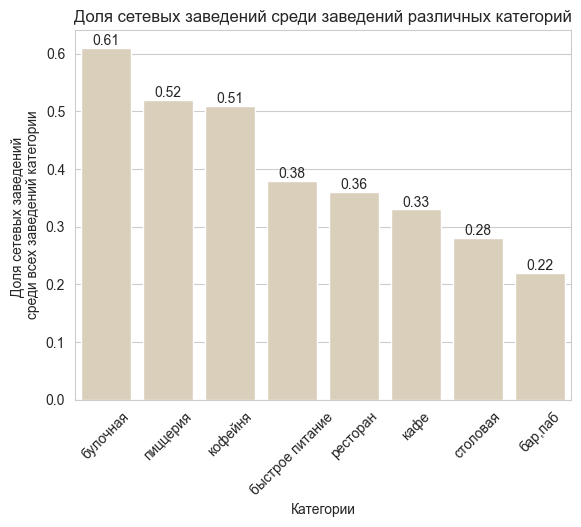

In [25]:
# Отразим долю сетевых заведений в заведениях разных категорий

data_by_chain_category['Доля сетевых'] = (data_by_chain_category['Сетевое']/(data_by_chain_category['Сетевое']+data_by_chain_category['Несетевое'])).round(2)
data_by_chain_category = data_by_chain_category.reset_index().sort_values(by = 'Доля сетевых', ascending = False)
ax = sns.barplot(x = 'category', y = 'Доля сетевых', data = data_by_chain_category, color ='#DED0B6')
plt.title('Доля сетевых заведений среди заведений различных категорий')
plt.xlabel('Категории')
plt.ylabel('Доля сетевых заведений \nсреди всех заведений категории')
plt.xticks(rotation = 45)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width()/2, p.get_height()), ha = 'center', va = 'bottom')
plt.show()

Среди всех категорий заведений наибольшая доля внутри категории преходится на сети у булочных, пиццерий и кофеен - более 50% всех заведений этих категорий являются сетевыми. 

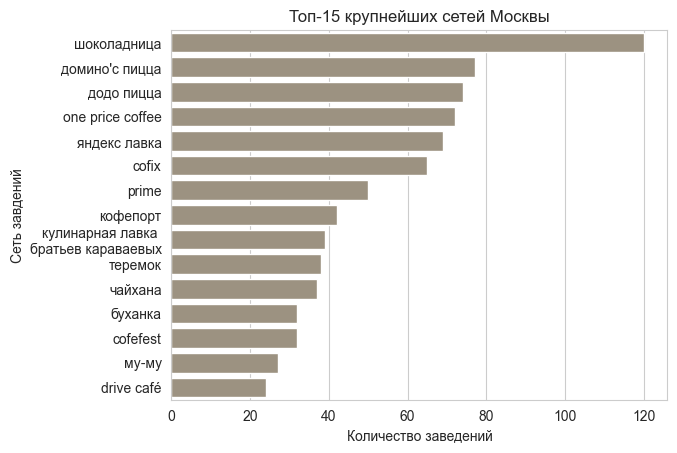

In [27]:
# Определим крупнейшие в Московском регионе сети, исключив общие названия, которые характеризуют категорию, не являясь сетью
data_by_chain_name = (data
                       .query('name not in ["кафе", "хинкальная", "шаурма", "ресторан", "столовая"]')
                       .groupby('name')
                       .agg({'address': 'count', 'category':'first'})
                       .sort_values(by = 'address', ascending = False)
                       .reset_index()
                       .rename(columns = {'name':'Название сети', 'address': 'Количество заведений', 'category': 'Категория'}).loc[0:14]
                      )
data_by_chain_name['Название сети'] = data_by_chain_name['Название сети'].replace('кулинарная лавка братьев караваевых', 'кулинарная лавка \nбратьев караваевых')
ax = sns.barplot(x = 'Количество заведений', y = 'Название сети', data = data_by_chain_name, color = '#A0937D')
plt.title('Топ-15 крупнейших сетей Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Сеть завдений')
plt.show()

In [28]:
# Определим категории заведений из Топ-15 крупнейших сетей Москвы
data_by_chain_name['Категория'].value_counts()

кофейня     5
кафе        4
ресторан    3
пиццерия    2
булочная    1
Name: Категория, dtype: int64

В топ-15 вошли кофейни, кафе, пиццерии, булочные и рестораны. Среди 15 крупнейших сетей Москвы - 5 шт. (более 30 %) - кофейни), 4 шт. - кафе. При этом все вошедшие в топ заведения - это предстваитеи сферы быстрого питания: даже сети, указанные в рейтине как "ресторан" по сути - фастфуд, например Теремок и Prime.

In [29]:
# Определим, какие административные районы Москвы присутствуют в датасете и какие заведения в них преобладают
data_by_district_categories = (data
                               .pivot_table(index = ['district', 'category'], values = 'name', aggfunc = 'count')
                               .reset_index()
                               .sort_values(['category', 'name'])
                               .rename(columns = {'district': 'Административный район', 'name': 'Количество заведений', 'category': 'Категория'})
                              )
custom_colors = {'кафе': '#A0937D', 'ресторан': '#607274', 'кофейня': '#E6B9A6', 'пиццерия': '#DED0B6', 'бар,паб': '#B6C7AA', 'быстрое питание': '#CCD3CA', 'булочная': '#2F3645', 'столовая': '#939185'}
fig = px.bar(data_by_district_categories, x = 'Количество заведений', y = 'Административный район', color = 'Категория', color_discrete_map = custom_colors, title = 'Административные районы Москвы в разбивке по категориям').update_yaxes(categoryorder = 'total ascending')
fig.show()

Наибольшее количество заведений расположены в ЦАО, в основном это рестораны, кофейни, кафе и бары. Меньше всего заведений в САО. 

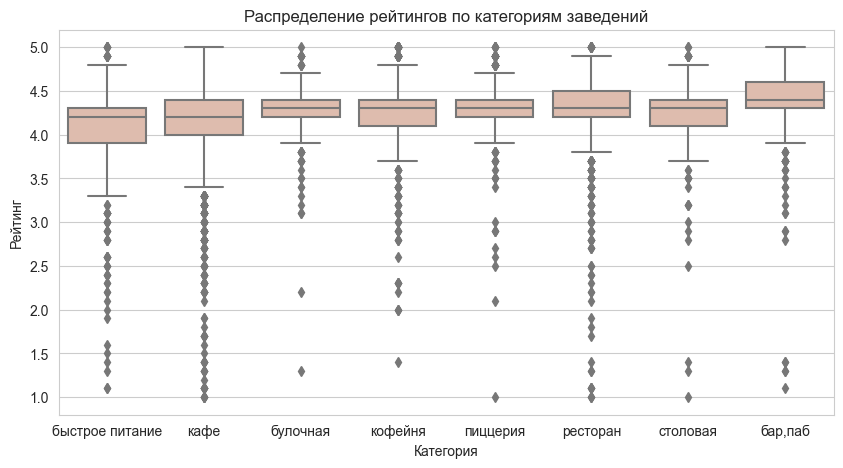

In [30]:
# Изучим распределение средних рейтингов по категориям заведений

plt.figure(figsize = (10, 5))
sns.boxplot(x='category', y='rating',data=data, color = '#E6B9A6', order = data.pivot_table(index = 'category',  values = 'rating', aggfunc  = 'median').reset_index().sort_values(by='rating')['category'].tolist())
plt.title('Распределение рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

Наиболее высокий средний рейтинг у баров и пабов, столовых и ресторанов, наименьший -  у заведений быстрого питания, кафе и булочных. Бары и кафе не имеют выбросов с высокими оценками, то есть высокие оценки не являются для них аномаллией, а у кафе, ресторанов и заведений быстрого питания большое количество низких рейтингов в вбыросах.

In [31]:
#  Оценим средний рейтинг заведений каждого района

data_raiting_per_districts = data.pivot_table(index = 'district', values = 'rating', aggfunc = 'median').reset_index().sort_values(by = 'rating', ascending = False)
display(data_raiting_per_districts)

# Добавим данные о рейтингах на карту

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

Choropleth(
    geo_data=state_geo,
    data = data_raiting_per_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам Москвы',
).add_to(m)

m

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


Самый высокий медианный рейтинг (4.4) у заведений, расположенных в ЦАО. Наименьший рейтинг у СВАО и ЮВАО. Остальные районы имеют примерно одинаковый медианный рейтинг.

In [32]:
# Выведем все заведения Москвы на карте

# создадим пустой кластер, добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Высокая концентрация заведений и их дороговизна в ЦАО обяъсняется тем, что ЦАО - не только географический, но и туристический, а также деловой центр Москвы. Именно на территории ЦАО расположены 6 вокзалов, офисный комплекс Москва-Сити, множество театров, музеев,  и государственных учреждений, что обеспечивает непрерывный поток потенциальных посетителей для объектов общественного питания и привлекает новых участников рынка несмотря на высокую конкуренцию и высочайшие цены на аренду.

In [86]:
# Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам

top_streets = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)[0:14].index
data_by_streets_categories = (data
                               .query('street in @top_streets')
                               .pivot_table(index = ['street', 'category'], values = 'name', aggfunc = 'count')
                               .reset_index()
                               .sort_values(['category', 'name'])
                               .rename(columns = {'street': 'Улица', 'name': 'Количество заведений', 'category': 'Категория'})
                              )
custom_colors = {'кафе': '#A0937D', 'ресторан': '#607274', 'кофейня': '#E6B9A6', 'пиццерия': '#DED0B6', 'бар,паб': '#B6C7AA', 'быстрое питание': '#CCD3CA', 'булочная': '#2F3645', 'столовая': '#939185'}
px.bar(data_by_streets_categories, x = 'Количество заведений', y = 'Улица', color = 'Категория', color_discrete_map = custom_colors, title = 'Улицы Москвы в разбивке по категориям заведений').update_yaxes(categoryorder = 'total ascending')

Проспект Мира - наиболее популярная улица в Москве, но и одна и самых длинных, наиболее  частые заведения - кафе, кофейни и рестораны, что характерно в целом для Москвы. Второе место у Профсоюзной улицы, последнее - у улицы Миклухо-Маклая. А целом, большинство, попавших в топ улиц - крупные проспекты и шоссе, поскольку мы учитываем плотность распоожения заведений, а только их количество, причина попадания улицы в топ может объясняться именно ее размером.

In [33]:
# Найдем улицы, на которых находится только один объект общепита
tail_streets = (data
                .groupby('street')
                .agg({'address': 'count', 'name':'first', 'category':'first', 'rating':'first', 'price':'first','chain': 'first', 'is_24_7':'first', 'lat':'first', 'lng':'first', 'district':'first'})
                .query('address == 1')
                .reset_index()
               )
# Выведем информацию о категориях единственных на улице заведений, о ценовой категории, приналежности к сети и том, работают ли они круглосуточно
display(tail_streets['category'].value_counts())
display(tail_streets['price'].value_counts())
display(tail_streets['chain'].value_counts())
display(tail_streets['is_24_7'].value_counts())
display(tail_streets['rating'].median())

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

средние          120
выше среднего     29
высокие           22
низкие            11
Name: price, dtype: int64

Несетевое    324
Сетевое      133
Name: chain, dtype: int64

False    426
True      31
Name: is_24_7, dtype: int64

4.3

Среди единственных на улице заведений наибольшее число - кафе, также много среди них ресторанов и кофеен, меньше всего булочных. Как правило, это несетевые заведения со средними ценами, которое не работает круглосуточно и имеет средний рейтинг.

In [34]:
# Выведем на карту количество единственных на улице заведений в разьивке по районам

tail_streets_one_st = (tail_streets
                       .pivot_table(index = 'district', values = 'name', aggfunc = 'count')
                       .reset_index()
                       .sort_values(by ='name', ascending = False)
                      )
display(tail_streets_one_st)

mt = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

tail_streets_one_st = (tail_streets
                       .pivot_table(index = 'district', values = 'name', aggfunc = 'count')
                       .reset_index()
                       .sort_values(by ='name', ascending = False)
                      )

Choropleth(
    geo_data=state_geo,
    data = tail_streets_one_st,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Количество единственных на улице заведений по районам Москвы',
).add_to(mt)

mt

,district,name
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,51
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


Больше всего единственных на улице заведений - в ЦАО, меньше всего - на западе и юго-востоке Москвы.

In [35]:
# Посчитаем медианное значение средних чеков заведений в разбивке по районам

data_median_bill_per_district = (data
                                 .pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median')
                                 .reset_index()
                                 .sort_values(by ='middle_avg_bill', ascending = False)
                                )
display(data_median_bill_per_district)

# Добавим медианные значения средних чеков на карту

mp = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

Choropleth(
    geo_data=state_geo,
    data = data_median_bill_per_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам Москвы',
).add_to(mp)

mp


,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Самые дорогие районы - ЗАО и ЦАО, далее по убыванию чеков - СЗАО и САО, самые дешевые расположены в СВАО, а также на юге и юго-востоке Москвы.

- Более 50 % всех заведений Москвы - кафе и рестораны, также относительно большая доля у кофеен - 16,8%, меньше всего (менее 4 % на каждую категорию) - столовых и булочных. 
- Самый популярный для расположения заведений район - ЦАО, он же является самым дорогим, разделяя пальму первенства с ЗАО - средний чек составляет 1000 руб. 
- Самые дешевые заведения распожены в СВАО, а также на юге и юго-востоке Москвы - средний чек в 2 и более раз меньше, чем в центре - 500 р. и менее. 
- Медианные рейтиги заведений в разных районах Москвы практически равны - чуть выше в ЦАО (4.4), чуть меньше на северо-востоке и юго-востоке (4.2) и равны у остальных (4.3). Для кафе и баров  высокие значения рейтингов не явяляются аномалиями, при этом кафе, рестораны и предприятия быстрого питания имеют большое число выбросов в виде низких рейтингов.
- Рестораны и кофейни попали в топ-3 категорий заведений по количеству посадочных мест, уступая лидерство лишь барам и пабам, где плотность рассадки имеет меньшее значение. 
- Чуть менее 40 % всех заведений являются сетевыми, чаще всего это булочные (61% всех булочных - часть сети), пиццерии (52% сетевые) и кофейни (51% - сетевые). 
- Среди 15 крупнейших сетей Москвы - 5 кофеен и 4 кафе. При этом самая большая по количеству заведений сеть - кофейни Шоколадница, второе и третье место - пиццерии Додо и Доминос. Все заведения из топ-15 сетей Москвы по сути являются предприятиями быстрого питания. 

## Исследование: кофейни

In [36]:
# Определим количество и местоположение кофеен в Москве

data_coffeshop = data.query('category == "кофейня"')
data_coffeshop_by_district = (data_coffeshop
                  .pivot_table(index='district', values ='name', aggfunc = 'count')
                  .reset_index()
                  .sort_values(by ='name', ascending = False)
                 )
data_coffeshop_by_district['area_rate'] = (data_coffeshop_by_district['name']/data_coffeshop_by_district['name'].sum()).round(2)
display(data_coffeshop_by_district)

# Добавим данные о кофейнях на карту

mс = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

Choropleth(
    geo_data=state_geo,
    data = data_coffeshop_by_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам Москвы',
).add_to(mс)

# создадим пустой кластер, добавим его на карту
marker_cluster_с = MarkerCluster().add_to(mс)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_с(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster_с)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffeshop.apply(create_clusters_с, axis=1)

# выводим карту
mс

,district,name,area_rate
5,Центральный административный округ,428,0.30
2,Северный административный округ,193,0.14
3,Северо-Восточный административный округ,159,0.11
1,Западный административный округ,150,0.11
8,Южный административный округ,131,0.09
0,Восточный административный округ,105,0.07
7,Юго-Западный административный округ,96,0.07
6,Юго-Восточный административный округ,89,0.06
4,Северо-Западный административный округ,62,0.04


Больше всего кофеен(30 % всех заведений), как и других завдений - в ЦАО, меньше всего - в СЗАО - 4%

In [37]:
# Проверим, есть ли в Москве круглосуточные кофейни

coffee_24_7 = data_coffeshop.query('is_24_7 == True').pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
merged_coffe_data = data_coffeshop_by_district[['district', 'name']].merge(coffee_24_7, on ='district').rename(columns = {'name_x':'total', 'name_y':'24_7'})
merged_coffe_data['rate_24_7'] = (merged_coffe_data['24_7'] /merged_coffe_data['total']).round(2) 
merged_coffe_data


,district,total,24_7,rate_24_7
0,Центральный административный округ,428,26,0.06
1,Северный административный округ,193,5,0.03
2,Северо-Восточный административный округ,159,3,0.02
3,Западный административный округ,150,9,0.06
4,Южный административный округ,131,1,0.01
5,Восточный административный округ,105,5,0.05
6,Юго-Западный административный округ,96,7,0.07
7,Юго-Восточный административный округ,89,1,0.01
8,Северо-Западный административный округ,62,2,0.03


Круглосуточных кофеен немного (максимальная доля - около 7 % в ЮЗАО), в основном они сосредоточены в ЦАО.

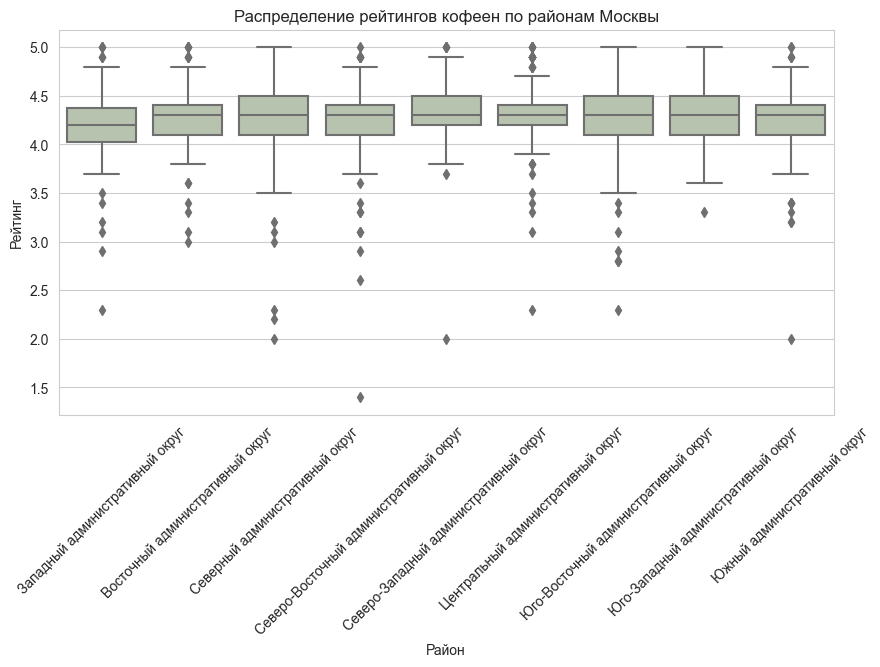

In [43]:
# Изучим рейтинги кофеен и как они расположены

plt.figure(figsize = (10, 5))
sns.boxplot(x='district', y='rating',data=data_coffeshop, color = '#B6C7AA', order = data_coffeshop.pivot_table(index = 'district',  values = 'rating', aggfunc  = 'median').reset_index().sort_values(by='rating')['district'].tolist())
plt.title('Распределение рейтингов кофеен по районам Москвы')
plt.xlabel('Район')
plt.ylabel('Рейтинг')
plt.xticks(rotation = 45)
plt.show()

In [40]:
# Выведем медианные рейтинги районов Москвы
data_coffeshop.pivot_table(index = 'district',  values = 'rating', aggfunc  = 'median').sort_values(by='rating', ascending = False)

,rating
district,
Восточный административный округ,4.3
Северный административный округ,4.3
Северо-Восточный административный округ,4.3
Северо-Западный административный округ,4.3
Центральный административный округ,4.3
Юго-Восточный административный округ,4.3
Юго-Западный административный округ,4.3
Южный административный округ,4.3
Западный административный округ,4.2


Медианные рейтинги у кофеен в большинстве районов (кроме ЗАО, где он меньше, чем у конкурентов), равны. Однако в ЮЗАО и СЗАО почти нет выбросов с экстремально низкими рейтингами, а в САО, ЮВАО и ЮЗАО высокие рейтинги не являются выбросами.

In [41]:
# Оценим медианное значение стоимости чашки капучино в разных районах Москвы.

data_median_coffee_per_district = (data_coffeshop
                                 .pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median')
                                 .reset_index()
                                 .sort_values(by ='middle_coffee_cup', ascending = False)
                                )
display(data_median_coffee_per_district)

# Добавим медианные значения стоимости чашки капучино на карту

mf = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

Choropleth(
    geo_data=state_geo,
    data = data_median_coffee_per_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Медианнвя средняя стоимость чашки капучино по районам Москвы',
).add_to(mf)

mf


,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Самый дорогой кофе - в центре, на западе и юго-западе Москвы. Самый дешевый - в ВАО.

In [42]:
# Оценим медианное значение стоимости чашки капучино в разных районах Москвы в сетевых заведениях и нет
data_median_coffee_per_district_chain = (data_coffeshop
                                 .pivot_table(index = 'district', columns = 'chain', values = 'middle_coffee_cup', aggfunc = 'median')
                                 .reset_index()
                                )
data_median_coffee_per_district_chain['Превышение цены в несетевом заведении'] = data_median_coffee_per_district_chain['Сетевое'] < data_median_coffee_per_district_chain['Несетевое']
data_median_coffee_per_district_chain.sort_values(by = 'Превышение цены в несетевом заведении', ascending = False)

chain,district,Несетевое,Сетевое,Превышение цены в несетевом заведении
2,Северный административный округ,165.0,140.0,True
3,Северо-Восточный административный округ,162.5,162.0,True
5,Центральный административный округ,195.0,180.0,True
6,Юго-Восточный административный округ,150.0,130.0,True
8,Южный административный округ,170.0,109.5,True
0,Восточный административный округ,135.0,135.0,False
1,Западный административный округ,170.0,222.5,False
4,Северо-Западный административный округ,165.0,172.0,False
7,Юго-Западный административный округ,190.5,199.5,False


В одних районах стоимость чашки капучино в сетевом заведении ниже, чем в несетевом, в других - наоборот. Вероятно, это зависит от типа конкретной сети. Так, чашка капучино в сетевой кофемании будет ощутимо выше, чем в сетевом Cofix.

При выборе местоположения новой кофейни наличие конкурентов - важный фактор. Несмотря на ценовую привлекательность ЦАО, который с ценой за чашку капучина 190 руб. занимает второе место в рейтинге самых дорогих районов Москвы, самое большое количество кофеен (30% от всех кофеен Москвы) сконцентрировано именно там. Тем временем, стоит обратить внимание на районы с небольшим количеством конкурентов и относительно высокой ценой за чашку капучино, такие как ЮЗАО (7% всех кофеен, 1 место в рейтине самых дорогих районов по цене за чашку кофе) и СЗАО (4 % всех кофеен и 4 место в рейтинге по цене). Медианный рейтинг кофеен этих районах такой же, как у других районов. Небольшое количество круглосуточных кофеен в Москве может говорить не столько о наличии свободной ниши, сколько о возможной нерентабельности такого формата и его окупаемости только в случае наличия круглосуточного потока посетителей в таких местах, как вокзалы и аэропорты, поэтому открытие круглосуточной кофейни обосновано в случае наличия инфраструктуры, способной обеспечить поток посетителей в ночное время суток. При этом для принятия решения о местоположении новой кофейни также необходимо оценить и другие важные факторы, такие как проходимость и стоимость аренды.